# Verkeersborden clusteren

Github: https://github.com/rwsdatalab/verkeersborden

Dit notebook is een tutorial waarin we met PCA en HOG features verkeersborden te cluteren. Het doel is om uit te leggen hoe er op een data gedreven manier afbeeldingen gegroepeerd kunnen worden. Dit kan een basis vormen voor supervised technieken waarbij de labels nodig zijn. Meer informatie kan men terug vinden in de volgende [Medium blog](https://towardsdatascience.com/a-step-by-step-guide-for-clustering-images-4b45f9906128)

## Verkeersborden clusteren
Gegeven een afbeelding van een verkeersbord zullen we moeten bepalen wat voor verkeersbord we zien (bijvoorbeeld: Een voorrangsbord of een stopteken).

Voor de project gebruiken we Python en de libraries clustimage. Deze libraries moeten allereerst geinstalleerd worden van Pypi.Vervolgens gaan we de libraries importeren en de data downloaden.

In [ ]:
!pip install clustimage

In [46]:
import cv2
import skimage.transform

import matplotlib.pyplot as plt
%matplotlib inline

from clustimage import Clustimage
import os


In [ ]:
if not os.path.isfile('BelgiumTSC_Training.zip'):
  !wget https://btsd.ethz.ch/shareddata/BelgiumTSC/BelgiumTSC_Training.zip
  zf = ZipFile("BelgiumTSC_Training.zip")
  zf.extractall("../data/")
  zf.close()

In [ ]:
if not os.path.isfile('BelgiumTSC_Testing.zip'):
  !wget https://btsd.ethz.ch/shareddata/BelgiumTSC/BelgiumTSC_Testing.zip
  zf = ZipFile("BelgiumTSC_Testing.zip")
  zf.extractall("../data/")
  zf.close()

In [33]:
# Load training and testing datasets./
ROOT_PATH = "./"
train_data_dir = os.path.join(ROOT_PATH, "../data/Training")
test_data_dir = os.path.join(ROOT_PATH, "../data/Testing")

In [39]:
def load_data(data_dir):
    """Loads a data set and returns two lists:
    
    images: a list of Numpy arrays, each representing an image.
    labels: a list of numbers that represent the images labels.
    """
    # Get all subdirectories of data_dir. Each represents a label.
    directories = [d for d in os.listdir(data_dir) 
                   if os.path.isdir(os.path.join(data_dir, d))]
    # Loop through the label directories and collect the data in
    # two lists, labels and images.
    labels = []
    images = []
    for d in directories:
        label_dir = os.path.join(data_dir, d)
        file_names = [os.path.join(label_dir, f) 
                      for f in os.listdir(label_dir) if f.endswith(".ppm")]
        # For each label, load it's images and add them to the images list.
        # And add the label number (i.e. directory name) to the labels list.
        for f in file_names:
            images.append(cv2.imread(f))
            labels.append(int(d))
    return images, labels


images, labels = load_data(train_data_dir)

print("Data is ingeladen in Python!")

Data is ingeladen in Python!


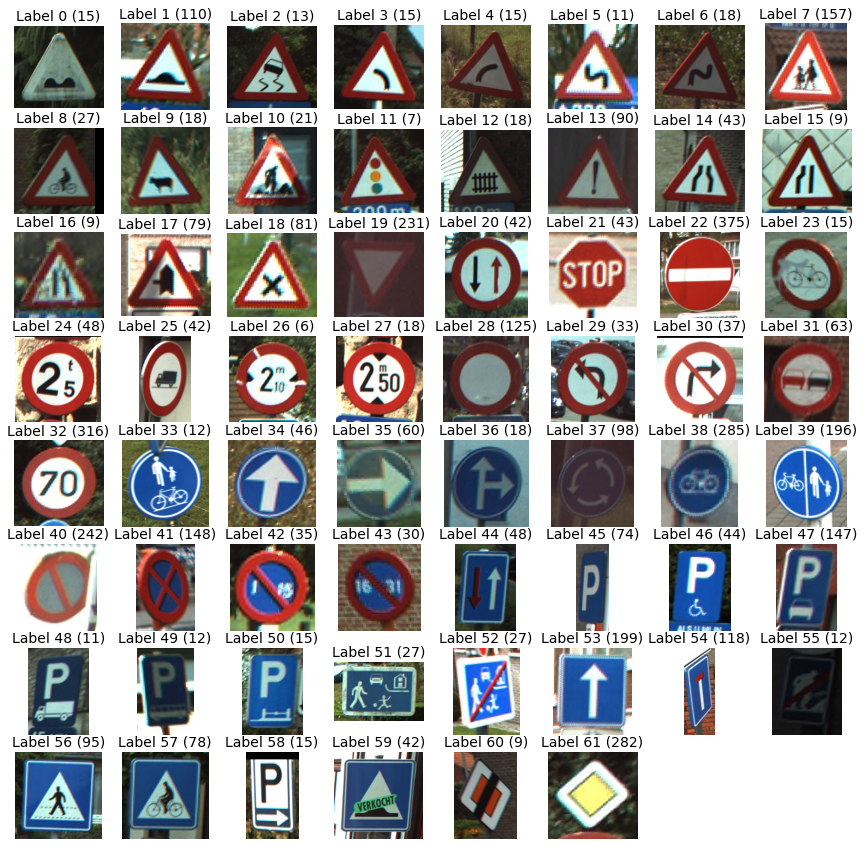

In [42]:
def display_images_and_labels(images, labels):
    """Display the first image of each label."""
    unique_labels = set(labels)
    plt.figure(figsize=(15, 15))
    i = 1
    for label in unique_labels:
        # Pick the first image for each label.
        image = images[labels.index(label)]
        plt.subplot(8, 8, i)  # A grid of 8 rows x 8 columns
        plt.axis('off')
        plt.title("Label {0} ({1})".format(label, labels.count(label)))
        i += 1
        _ = plt.imshow(image[..., ::-1])
    plt.show()

display_images_and_labels(images, labels)

Kijk eens! Dat ziet er goed uit! Zo te zien hebben we van alle verkeersborden een plaatje dat min of meer het hele beeld vult. Het valt wel op dat de plaatjes niet helemaal vierkant zijn, dat moeten we later wel oplossen. 

Laten we eerst nog eens een type wat meer in detail bekijken. Laten we eens beginnen met type 42.

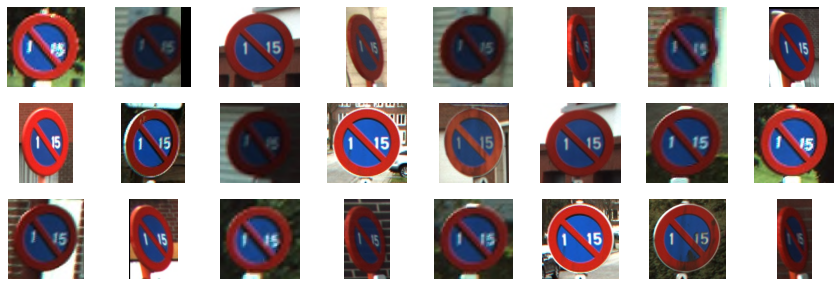

In [47]:
def display_label_images(images, label):
    """Display images of a specific label."""
    limit = 24  # show a max of 24 images
    plt.figure(figsize=(15, 5))
    i = 1

    start = labels.index(label)
    end = start + labels.count(label)
    for image in images[start:end][:limit]:
        plt.subplot(3, 8, i)  # 3 rows, 8 per row
        plt.axis('off')
        i += 1
        plt.imshow(image[..., ::-1])
    plt.show()

display_label_images(images, 42)

Ahah! Alle snelheidsgeboden vallen in dezelfde klasse. Clustering zou daar in principe mee om mee moeten kunnen gaan, maar het is wel goed om dit even gezien te hebben.

Kan je nu zelf andere klasses bekijken? Probeer bijvoorbeeld eens 26 en 27 te bekijken. Wat zou dit straks kunnen betekenen?

## Verschillende formaten
 
Het is over het algemeen handig om de plaatjes in hetzelfde formaat te hebben. We hebben al gezien dat dat in dit geval niet zo is. Een goede manier om dit op te lossen is om de plaatjes handmatig bij te knippen zodat we geen belangrijke delen missen.

Vandaag pakken we het snel aan, dus gaan we voor een hack: We schalen de plaatjes automatisch zonde te knippen. We gooien dus niks weg maar vervormen de beelden dus licht.

Hoe groot zijn de plaatjes?

In [44]:
for image in images[:5]:
    print("shape: {0}, min: {1}, max: {2}".format(image.shape, image.min(), image.max()))

shape: (92, 94, 3), min: 0, max: 255
shape: (243, 100, 3), min: 0, max: 255
shape: (85, 96, 3), min: 0, max: 255
shape: (103, 92, 3), min: 8, max: 255
shape: (87, 98, 3), min: 2, max: 255


Rond de 128 bij 128 dus. Als we ze nou eens allemaal afbeelden op 32x32, dan hebben we minder data (dus sneller resultaat) en ze zijn allemaal van hetzelfde formaat.

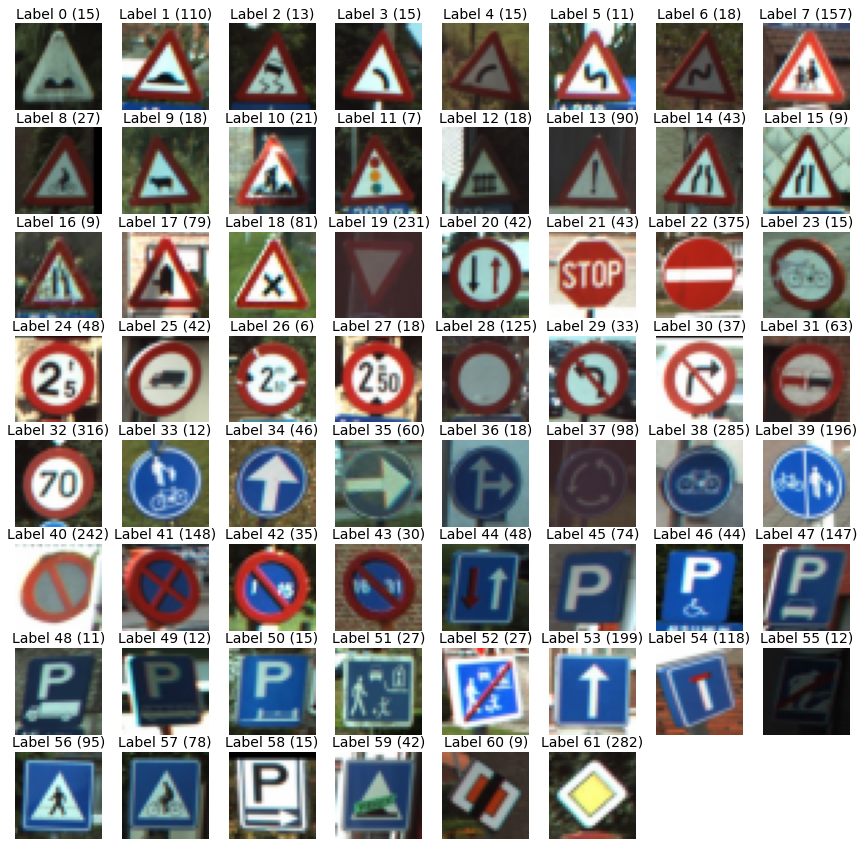

In [48]:
# Resize images
images32 = [skimage.transform.resize(image, (32, 32))
                for image in images]
display_images_and_labels(images32, labels)

Minder scherp, maar nog steeds herkenbaar!

# Clustering Model
Al deze stappen (dus resizen, scalen) worden al automatisch gedaan in de clustimage package.

In [ ]:
# Take the number of components that covers 95% of the data
cl = Clustimage(method='pca', params_pca={'n_components':0.95}, ext='ppm')

In [7]:
# Cluster met HOG features
cl = Clustimage(method='hog', ext='ppm')

[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >WARNING> Parameter grayscale is set to True coz you are using method="hog"
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]
[clustimage] >INFO> filepath is set to [/tmp/clustimage]


In [8]:
# Check whether in is dir, list of files or array-like
X = cl.import_data(test_data_dir)

[clustimage] >INFO> Extracting images from: [./../data/Testing]
[clustimage] >INFO> [2520] files are collected recursively from path: [./../data/Testing]
[clustimage] >INFO> [2520] images are extracted.
[clustimage] >INFO> Reading and checking images.
[clustimage] >INFO> Reading and checking images.
100%|██████████| 2520/2520 [00:00<00:00, 3675.61it/s]


In [9]:
# Extract features using method
Xfeat = cl.extract_feat(X)

[clustimage] >INFO> Extracting features using method: [hog]
100%|██████████| 2520/2520 [02:03<00:00, 20.35it/s]
[clustimage] >INFO> Extracted features using [hog]: samples=2520, features=16384


In [11]:
# Embedding using tSNE
xycoord = cl.embedding(Xfeat)

[clustimage] >INFO> Compute [tsne] embedding


In [15]:
# Cluster
labels = cl.cluster(min_clust=7, max_clust=50)

[clustimage] >INFO> Cluster evaluation using the [high] feature space of the [hog] features.



[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 18/18 [00:59<00:00,  3.31s/it]
[clustimage] >INFO> Updating cluster-labels and cluster-model based on the (2520, 16384) feature-space.


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [19].
[clusteval] >Fin.


In [13]:
# Or all in one run
# results = cl.fit_transform(X)

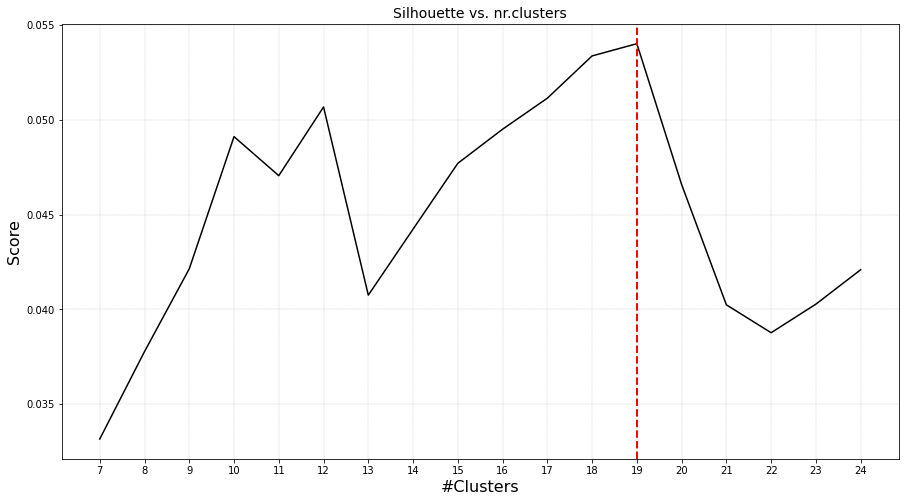

(<Figure size 1080x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f2a1499e250>)

In [20]:
# Plots
cl.clusteval.plot()


[colourmap]> Warning: Colormap [Set1] can not create [19] unique colors! Available unique colors: [9].


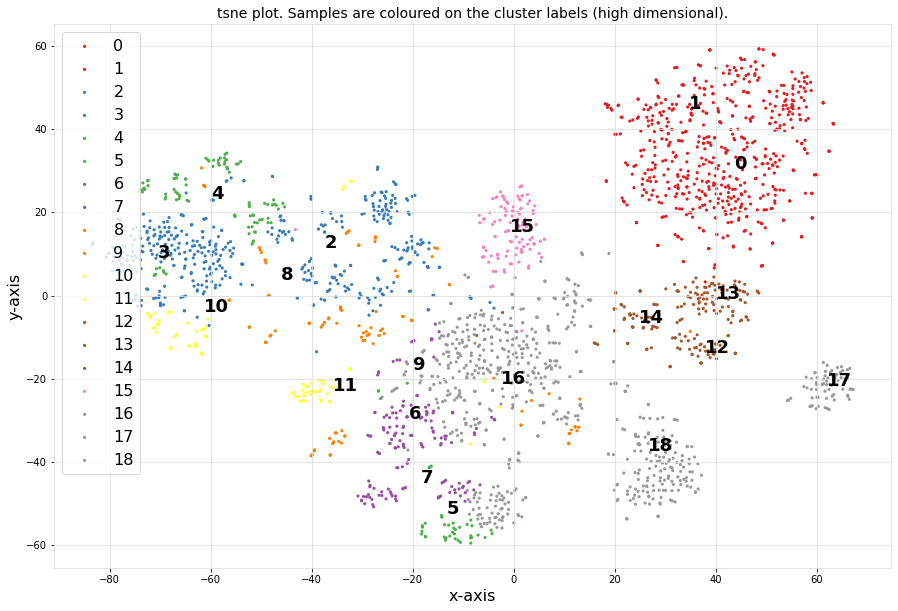

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f2a13de1090>)

<Figure size 432x288 with 0 Axes>

In [30]:
# Scatter
cl.scatter(dotsize=10, img_mean=False, zoom=None)

[colourmap]> Warning: Colormap [Set1] can not create [19] unique colors! Available unique colors: [9].


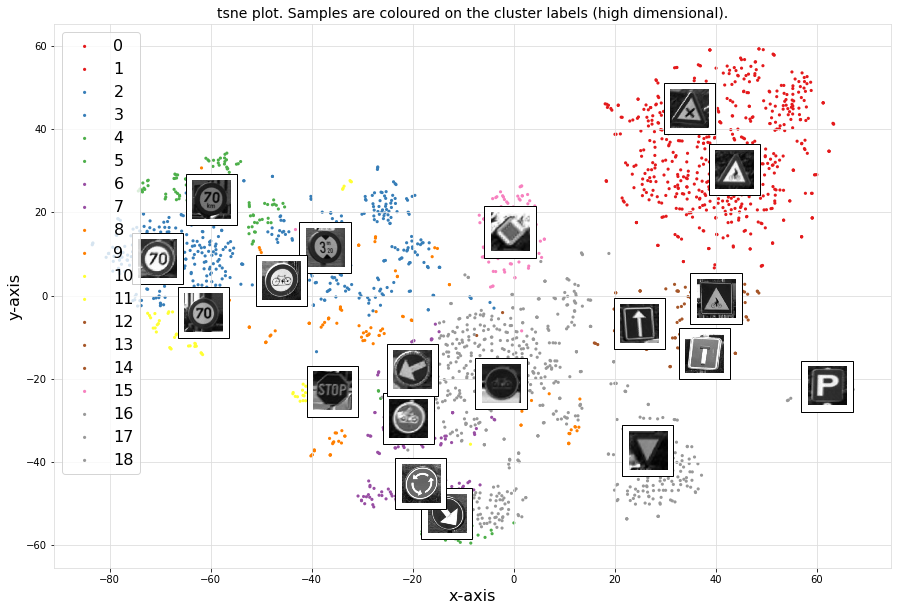

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f2a1f4a7990>)

<Figure size 432x288 with 0 Axes>

In [31]:
cl.scatter(dotsize=10, img_mean=False)

[colourmap]> Warning: Colormap [Set2] can not create [19] unique colors! Available unique colors: [8].


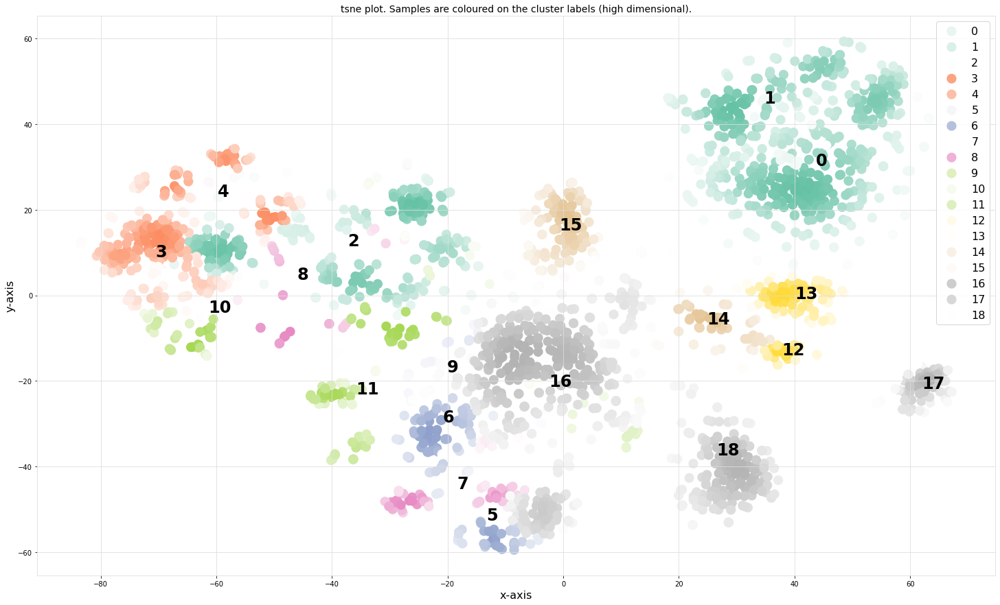

(<Figure size 1800x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f2a1de73b50>)

<Figure size 432x288 with 0 Axes>

In [32]:
cl.scatter(zoom=None, dotsize=200, figsize=(25, 15), args_scatter={'fontsize':24, 'gradient':'#FFFFFF', 'cmap':'Set2', 'legend':True})

[colourmap]> Warning: Colormap [Set1] can not create [19] unique colors! Available unique colors: [9].


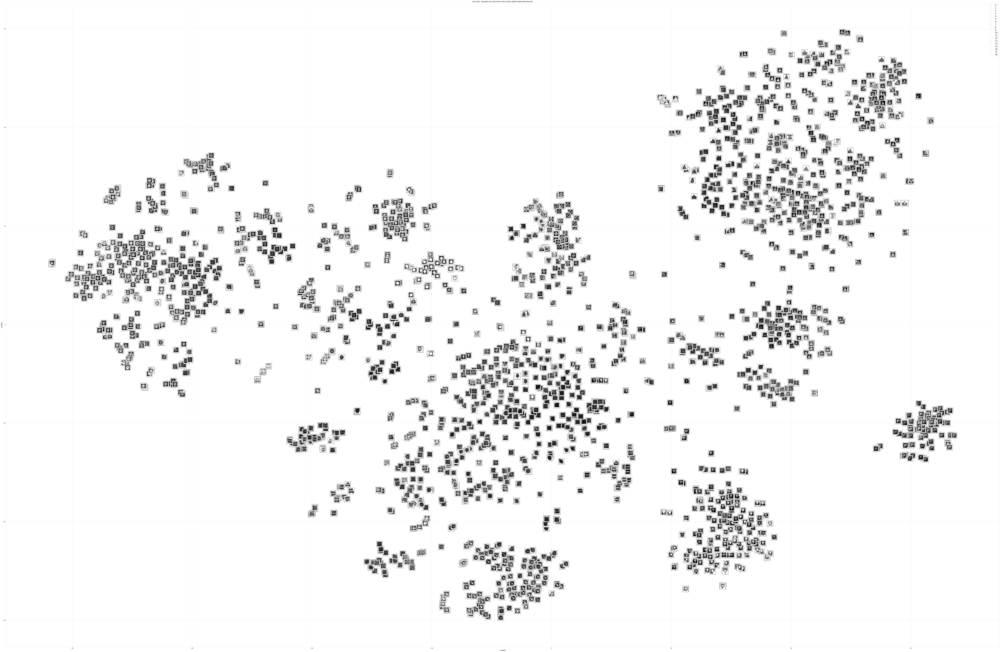

(<Figure size 10800x7200 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f2a1d112f90>)

<Figure size 432x288 with 0 Axes>

In [28]:
#cl.scatter(dotsize=10, plt_all=True, zoom=0.2)
cl.scatter(zoom=0.3, plt_all=True, figsize=(150,100))


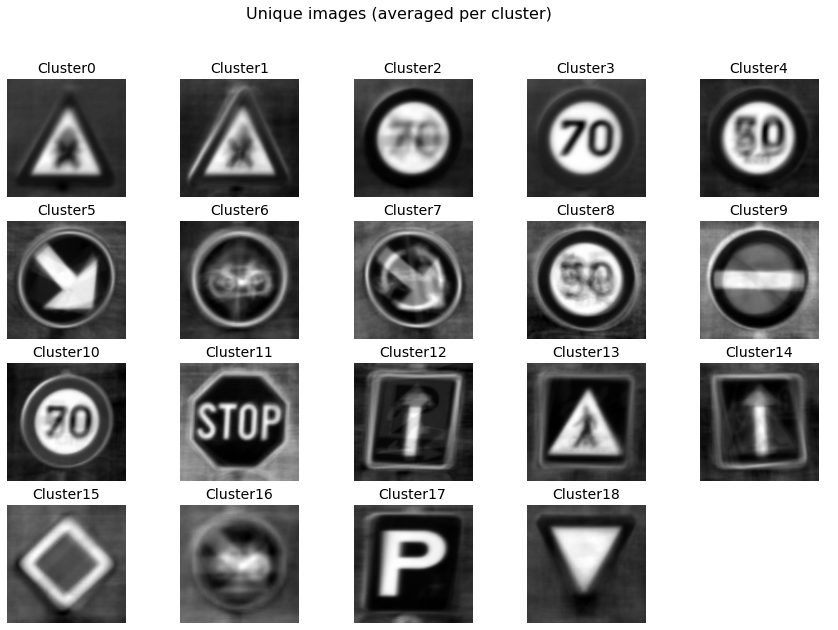

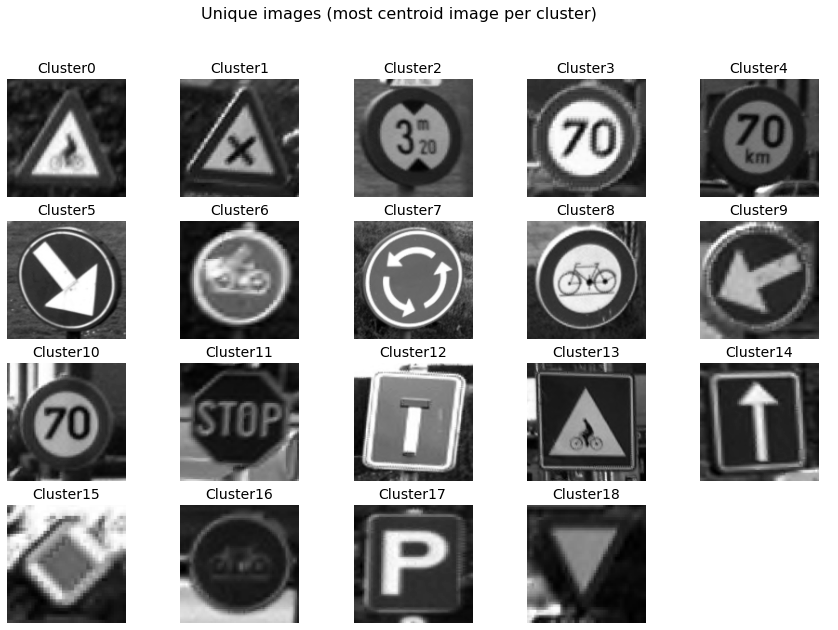

In [26]:
# Plot unique images.
cl.plot_unique()
cl.plot_unique(img_mean=False)


[clusteval] >Plotting the dendrogram with optimized settings: metric=euclidean, linkage=ward, max_d=3298.363. Be patient now..
[clusteval] >Compute cluster labels.


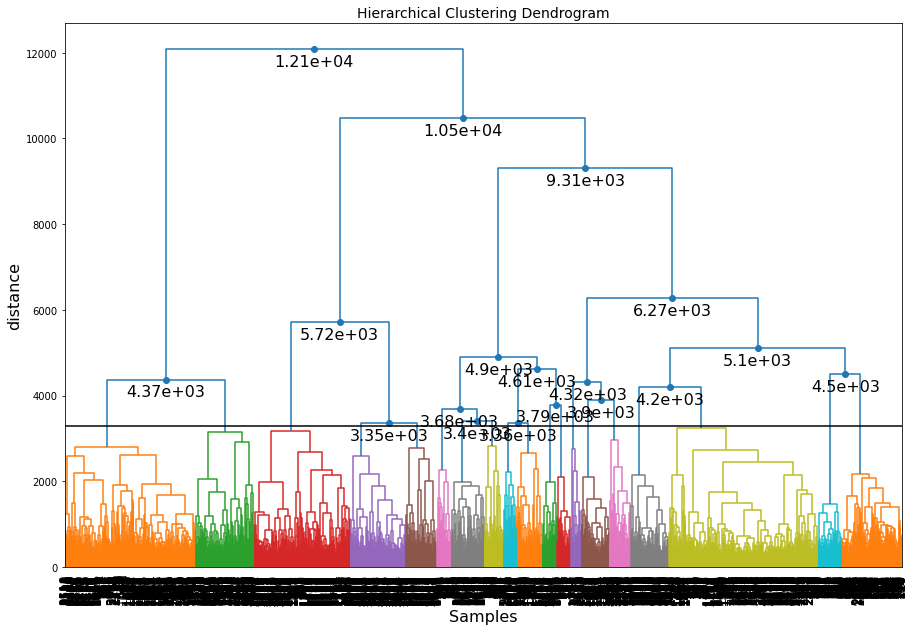

In [27]:
cl.dendrogram()


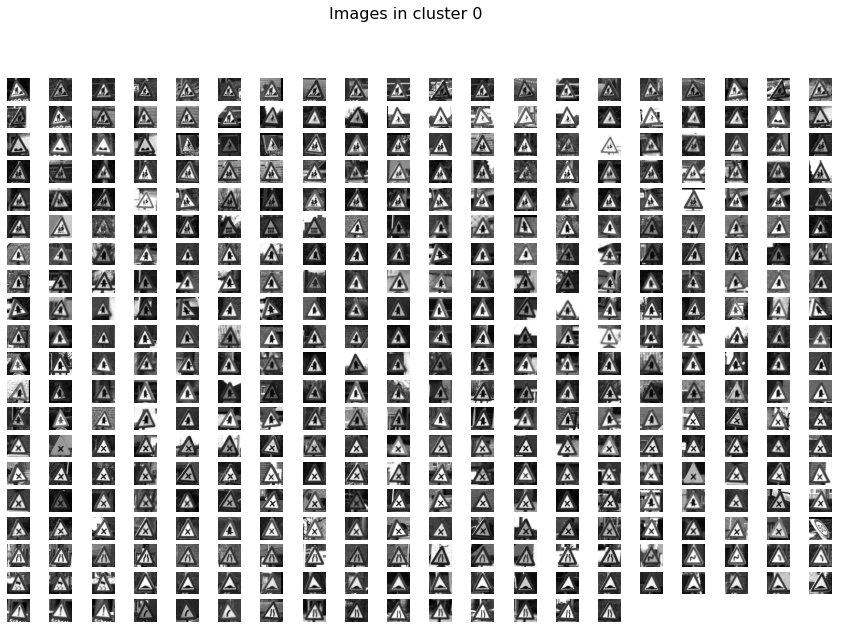

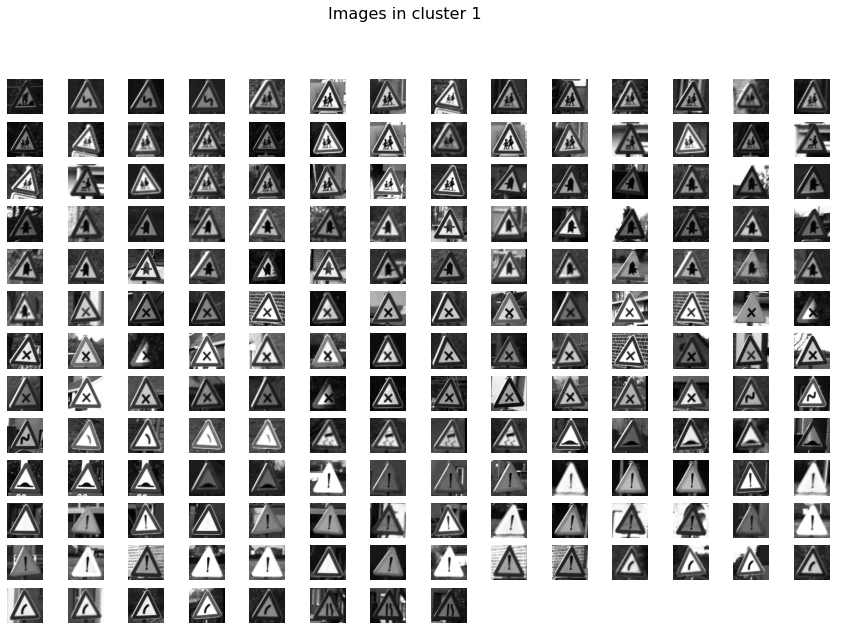

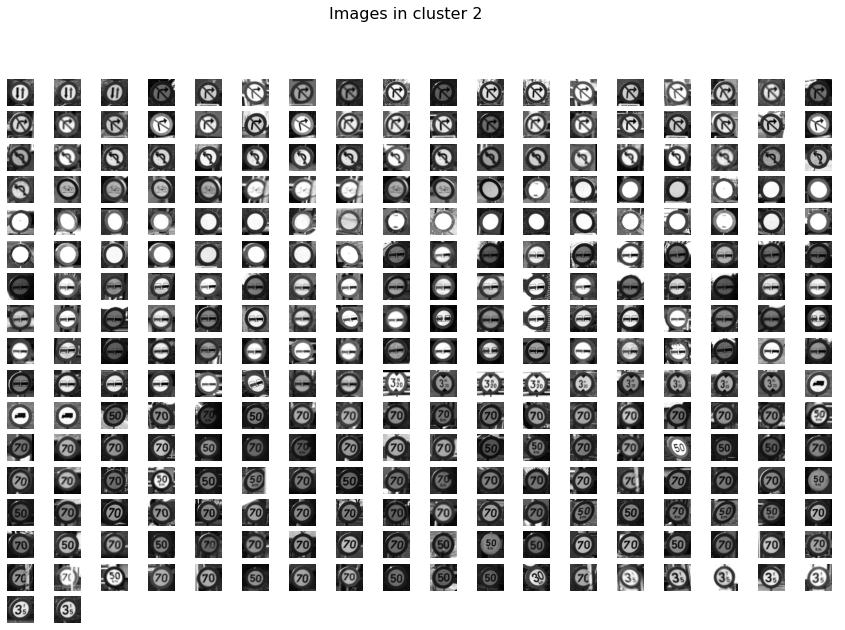

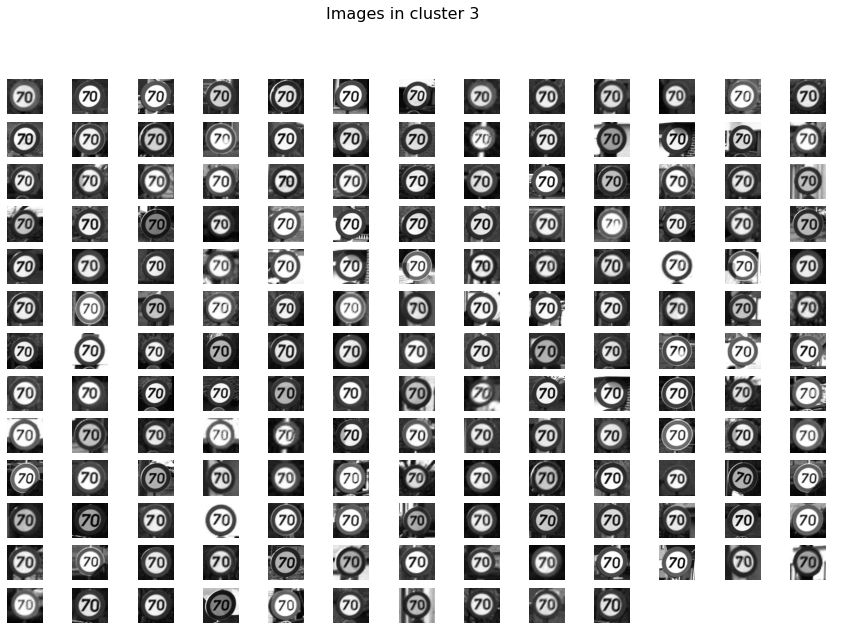

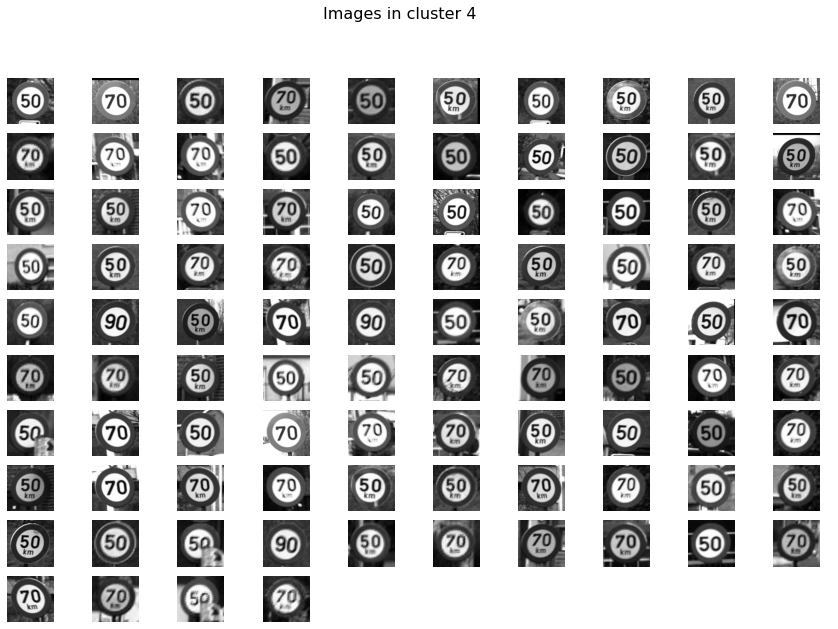

...

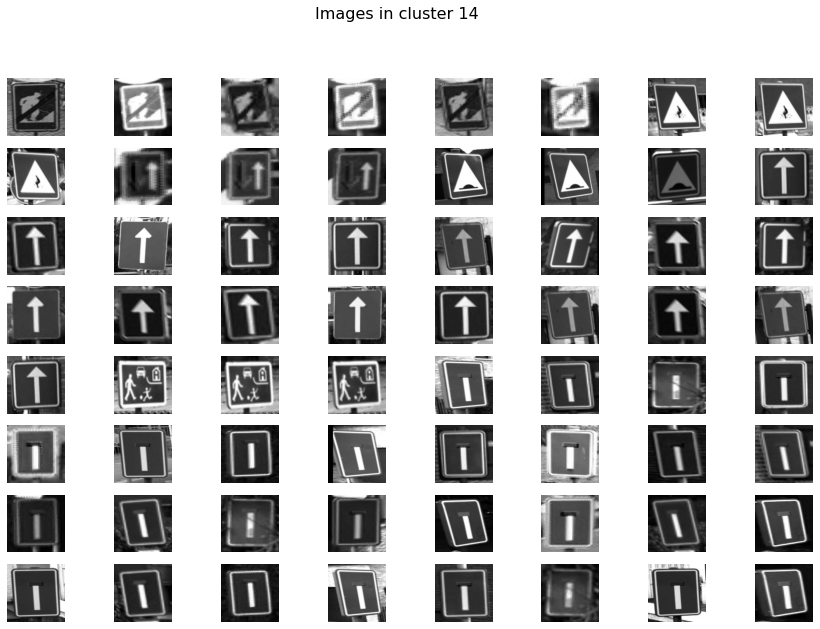

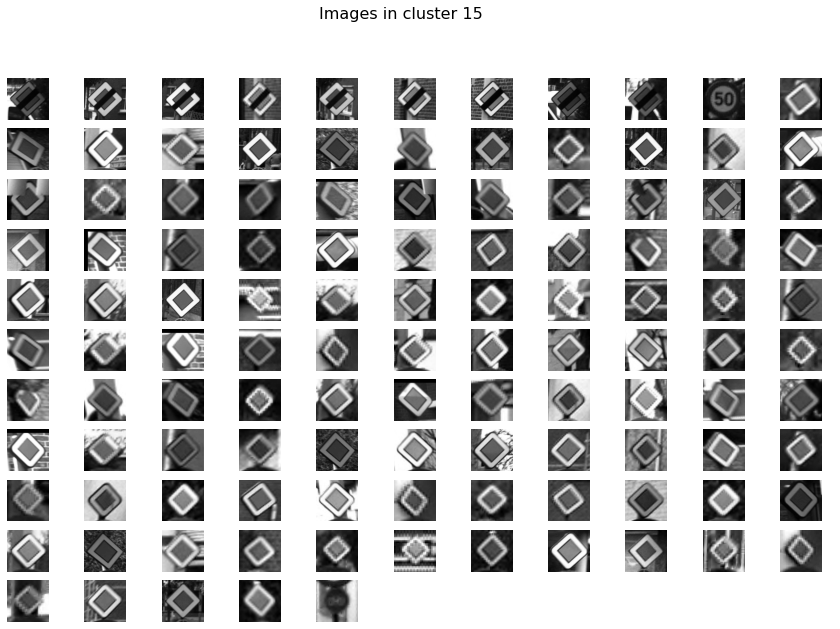

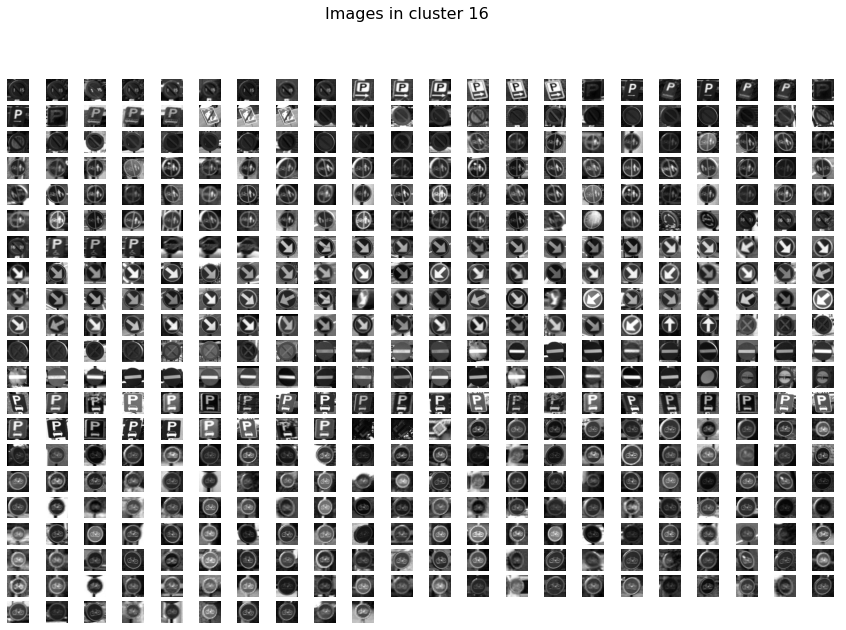

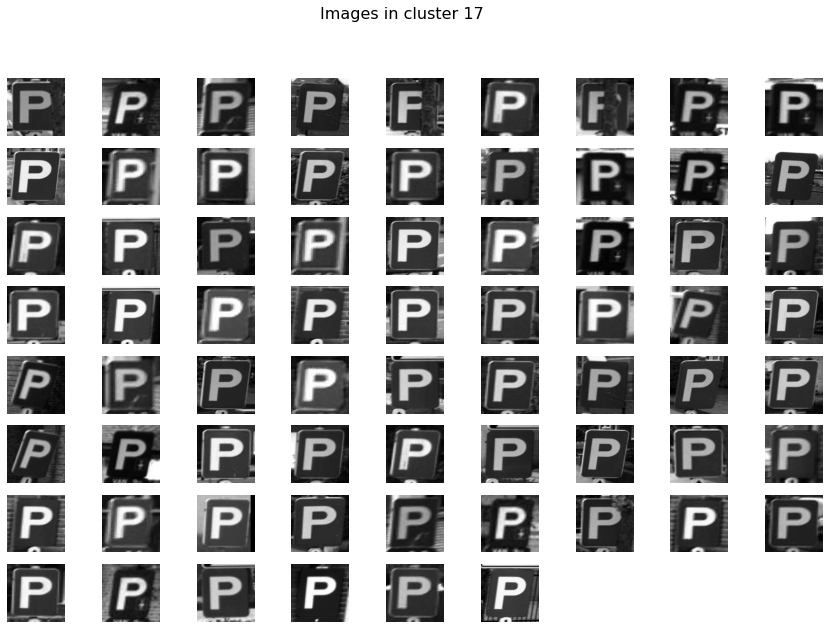

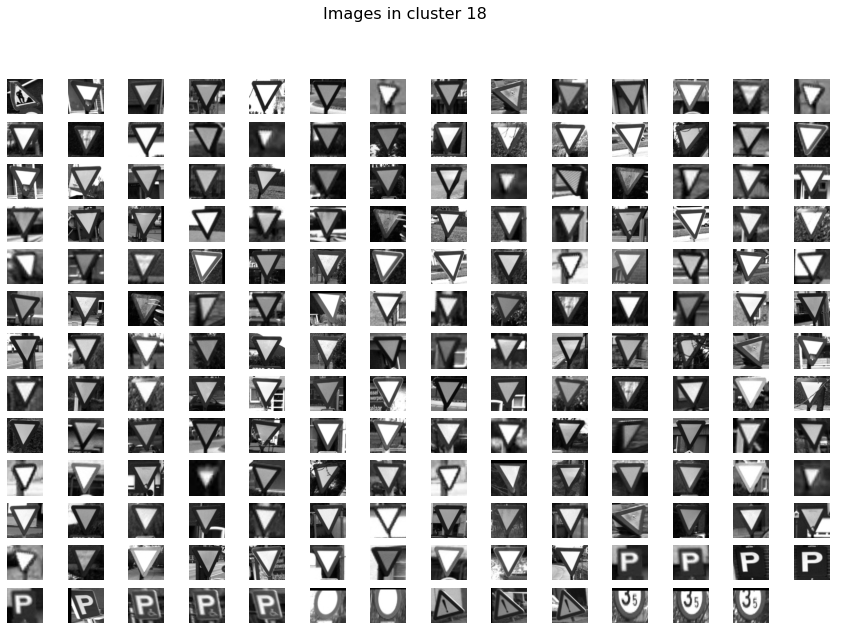

In [29]:
cl.plot()


In [ ]:
# Find
results_find = cl.find(Xraw[0], k=0, alpha=0.05)
cl.plot_find()